In [1]:
import os
import sys

In [2]:
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

In [3]:
lib_paths = ['../src/', '../cifar-10.1-pytorch/', '../data-copying/', '../PyTorch_CIFAR10/']
for path in lib_paths:
    if os.path.abspath(path) not in sys.path:
        sys.path.insert(0, os.path.abspath(path))
print(sys.path)

['/work/cybai2020/PyTorch-StudioGAN/PyTorch_CIFAR10', '/work/cybai2020/PyTorch-StudioGAN/data-copying', '/work/cybai2020/PyTorch-StudioGAN/cifar-10.1-pytorch', '/work/cybai2020/PyTorch-StudioGAN/src', '/work/cybai2020/PyTorch-StudioGAN/notebooks', '/home/cybai2020/miniconda3/envs/studiogan/lib/python37.zip', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7/lib-dynload', '', '/home/cybai2020/.local/lib/python3.7/site-packages', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7/site-packages', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7/site-packages/IPython/extensions', '/home/cybai2020/.ipython']


In [4]:
from matplotlib import pyplot as plt
import glob
from importlib import reload
import yaml
import numpy as np

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans 

import torch
from torch.nn import Parameter as P
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

import misc
reload(misc)
from models.retinaface import RetinaFaceProject
from models.reID import gan_proj_ft_net

from metrics.FID import calculate_frechet_distance
from metrics.feat_extract_models import alexnet, inception, vgg

import data_copying_tests
reload(data_copying_tests)

<module 'data_copying_tests' from '/work/cybai2020/PyTorch-StudioGAN/data-copying/data_copying_tests.py'>

In [5]:
device = 'cuda'
torch.backends.cudnn.benchmark = True

In [6]:
sys.path.insert(0, os.path.abspath('../Pytorch_Retinaface'))
from config import cfg_mnet, cfg_re50
sys.path.pop(0)
print(sys.path)

['/work/cybai2020/PyTorch-StudioGAN/PyTorch_CIFAR10', '/work/cybai2020/PyTorch-StudioGAN/data-copying', '/work/cybai2020/PyTorch-StudioGAN/cifar-10.1-pytorch', '/work/cybai2020/PyTorch-StudioGAN/src', '/work/cybai2020/PyTorch-StudioGAN/notebooks', '/home/cybai2020/miniconda3/envs/studiogan/lib/python37.zip', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7/lib-dynload', '', '/home/cybai2020/.local/lib/python3.7/site-packages', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7/site-packages', '/home/cybai2020/miniconda3/envs/studiogan/lib/python3.7/site-packages/IPython/extensions', '/home/cybai2020/.ipython']


In [7]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(0.5, 0.5)])

celebahq_128_train_dset = datasets.ImageFolder('../data/CELEBA-HQ_128/train', transform=transform)
celebahq_128_test_dset = datasets.ImageFolder('../data/CELEBA-HQ_128/valid', transform=transform)

In [8]:
celebahq_128_dls = {k: DataLoader(v, batch_size=50, shuffle=False, num_workers=8, drop_last=False)
                    for k, v in {'train': celebahq_128_train_dset, 'test': celebahq_128_test_dset}.items()}

In [9]:
with open('../Person_reID_baseline_pytorch/model/ft_ResNet50/opts.yaml', 'r') as stream:
    config = yaml.safe_load(stream)
proj_model = gan_proj_ft_net(config['nclasses'], stride = config['stride'], use_penultimate=True)
proj_model.load_state_dict(torch.load('../Person_reID_baseline_pytorch/model/ft_ResNet50/net_last.pth'))
proj_model = proj_model.eval().to(device)

In [10]:
feats = {}
for dset_name, dl in celebahq_128_dls.items():
    print(dset_name)
    _, feats_, _ = misc.project(dl, proj_model, n_samples=None, to_numpy=True, return_logits=None)
    # top_1_conf = np.amax(softmax(logits_, axis=-1), axis=-1)
    feats[dset_name] = feats_
print(feats['train'].shape, feats['test'].shape)

train
test
(24183, 2048) (5817, 2048)


In [11]:
nnds, _ = misc.calculate_knnd_numpy(target_feats=feats['test'], 
                                    ref_feats=feats['train'])
nnds.shape

(5817,)

0.05038474798202515
0.05984991788864136
0.06854178905487061
0.07674219608306884
0.08533734083175659
0.09567241668701172
0.10789154767990113
0.1244033694267273
0.1539678692817689


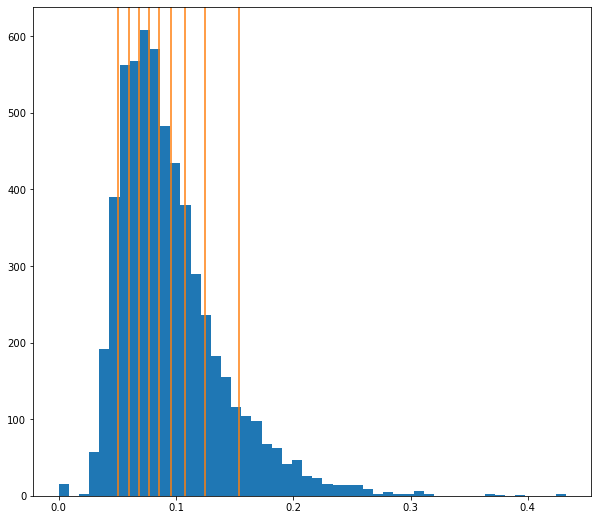

In [43]:
# use_penultimate=False
plt.figure(figsize=(10, 9))
plt.hist(nnds, bins=50)
for q in np.quantile(nnds, np.arange(0.1, 1, 0.1)):
    plt.axvline(q, color='tab:orange')
    print(q)

0.055577981472015384
0.06641838550567628
0.07550265789031982
0.08416125774383545
0.09426039457321167
0.10558066368103028
0.11845111846923828
0.13705296516418458
0.16932777166366578


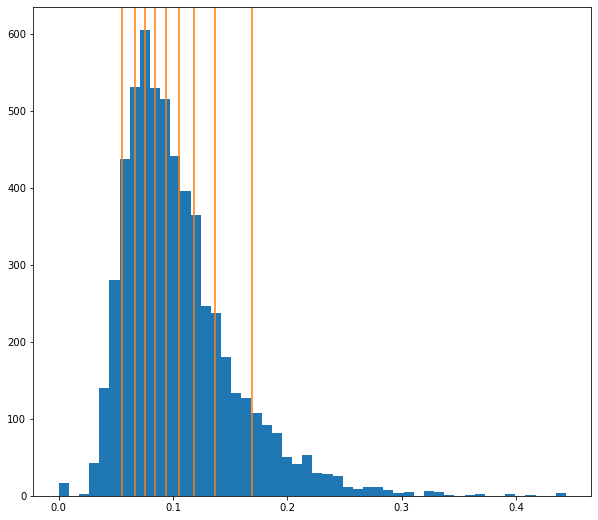

In [48]:
# use_penultimate=True
plt.figure(figsize=(10, 9))
plt.hist(nnds, bins=50)
for q in np.quantile(nnds, np.arange(0.1, 1, 0.1)):
    plt.axvline(q, color='tab:orange')
    print(q)

0.026927709579467773
0.03169683218002319
0.035477519035339355
0.03923220634460449
0.04341918230056763
0.0478061318397522
0.05299851894378663
0.060216307640075684
0.07212088108062745


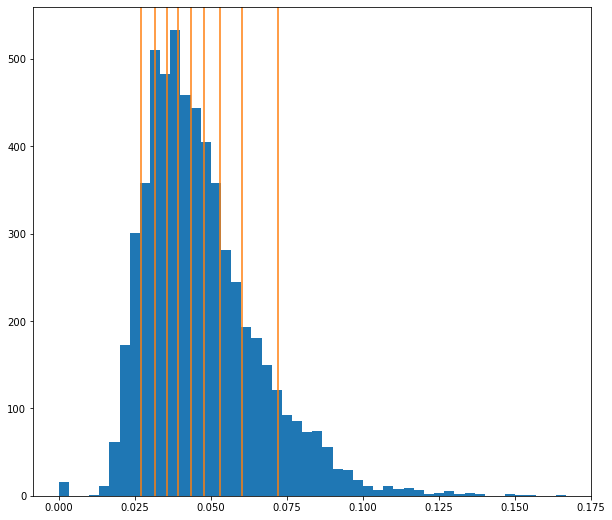

In [12]:
# use_penultimate=True (only pool)
plt.figure(figsize=(10, 9))
plt.hist(nnds, bins=50)
for q in np.quantile(nnds, np.arange(0.1, 1, 0.1)):
    plt.axvline(q, color='tab:orange')
    print(q)

0.03040965795516968
0.035468339920043945
0.039564347267150884
0.043672299385070806
0.0477752685546875
0.052433133125305176
0.05800615549087525
0.0654430627822876
0.07739388942718509


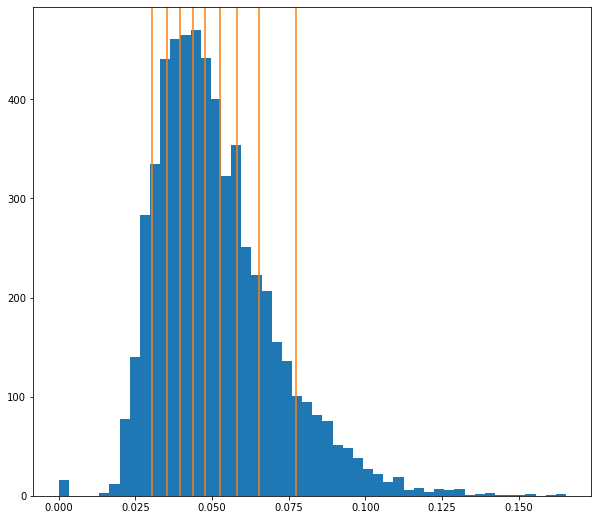

In [11]:
# use_penultimate=True (only pool no flip)
plt.figure(figsize=(10, 9))
plt.hist(nnds, bins=50)
for q in np.quantile(nnds, np.arange(0.1, 1, 0.1)):
    plt.axvline(q, color='tab:orange')
    print(q)

In [11]:
dset_means, dset_covs = {}, {}
for dset_name, feat in feats.items():
    dset_means[dset_name] = np.mean(feat, axis=0)
    dset_covs[dset_name] = np.cov(feat, rowvar=False)

In [13]:
calculate_frechet_distance(dset_means['train'], dset_covs['train'], 
                           dset_means['test'], dset_covs['test'])

0.533130999551318

In [13]:
biggan_runs = {
    0.00: ['BigGAN-train-2021_04_24_10_27_56'],
    0.01: ['BigGAN-train-2021_05_07_00_10_12'],
    0.02: ['BigGAN-train-2021_05_07_00_10_32'],
    0.03: ['BigGAN-train-2021_05_08_03_17_53'],
    0.035: ['BigGAN-train-2021_05_08_13_56_09'],
    0.04: ['BigGAN-train-2021_05_07_00_11_32'],
    0.045: ['BigGAN-train-2021_05_08_02_18_37']
}

In [14]:
def wrapper(runname, dset):
    if len(glob.glob(f'../checkpoints/{runname}/model=G_ema-best-weights-step=*.pth')) > 0:
        ema_g_path = glob.glob(f'../checkpoints/{runname}/model=G_ema-best-weights-step=*.pth')[0]
    else:
        ema_g_path = glob.glob(f'../checkpoints/{runname}/model=G-best-weights-step=*.pth')[0]
    config_path = f"../src/configs/{dset}/{runname.split('-')[0]}.json"
    sampler = misc.construct_sampler(ema_g_path, config_path, device)
    return sampler

In [14]:
def calculate_inception_metrics(samplers, savefig_fname=None, return_feats=False):
    
    # sample images
    print('start sampling images..')
    gen_feats = {}
    for mrt, samplers_ in samplers.items():
        print(f'mrt={mrt}')
        gen_feats[mrt] = []
        for sampler in samplers_:
            _, feats_, _ = misc.project(sampler, proj_model, to_numpy=True, return_logits=None,
                                        n_samples=10000)
            gen_feats[mrt].append(feats_)
            
    # calculate inception stats
    print('start calculating inception stats..')
    gen_means, gen_covs = {}, {}
    for mrt, gen_feats_ in gen_feats.items():
        gen_means[mrt] = []
        gen_covs[mrt] = []
        for gen_feat in gen_feats_:
            mu = np.mean(gen_feat, axis=0)
            cov = np.cov(gen_feat, rowvar=False)
            gen_means[mrt].append(mu)
            gen_covs[mrt].append(cov)
            
    # FID
    print('start calculating FID..')
    fids = {}
    for dset_name in feats.keys():
        print(f"{dset_name}:", end=' ')
        fids_ = {}
        for mrt in gen_feats.keys():
            fids_[mrt] = []
            print(mrt, end=', ')
            for mu, cov in zip(gen_means[mrt], gen_covs[mrt]):
                fid = calculate_frechet_distance(mu, cov, dset_means[dset_name], 
                                                 dset_covs[dset_name])
                fids_[mrt].append(fid)
        fids[dset_name] = fids_
        print("")
    
    # plot
    plot_inception_metrics(fids, savefig_fname)
    
    if return_feats:
        return fids, gen_feats
    else:
        return fids

def plot_inception_metrics(fids, savefig_fname=None):
    x = np.arange(len(list(fids.values())[0]))  # the label locations
    width = 0.7  # the width of the bars
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    for (dset_name, fids_), ax in zip(fids.items(), axs.flat):
        rects = ax.bar(x, [np.mean(fid) for fid in fids_.values()], width,
                       yerr=[np.std(fid) for fid in fids_.values()])

        misc.autolabel(rects, ax)
        ax.set_xticks(x)
        ax.set_xticklabels(list(fids_.keys()))
        ax.set_xlabel('mrt')
        ax.set_title(f"FID ({dset_name})")

    plt.tight_layout()
    if savefig_fname is not None:
        if not savefig_fname.endswith('.pdf'):
            savefig_fname += '.pdf'
        plt.savefig(savefig_fname, bbox_inches='tight')

In [15]:
runs = biggan_runs
samplers = {mrt: [wrapper(runname, 'CELEBA-HQ_128') for runname in runs[mrt]]
            for mrt in runs.keys()}

start sampling images..
mrt=0.0
mrt=0.01
mrt=0.02
mrt=0.03
mrt=0.035
mrt=0.04
mrt=0.045
start calculating inception stats..
start calculating FID..
train: 0.0, 0.01, 0.02, 0.03, 0.035, 0.04, 0.045, 
test: 0.0, 0.01, 0.02, 0.03, 0.035, 0.04, 0.045, 


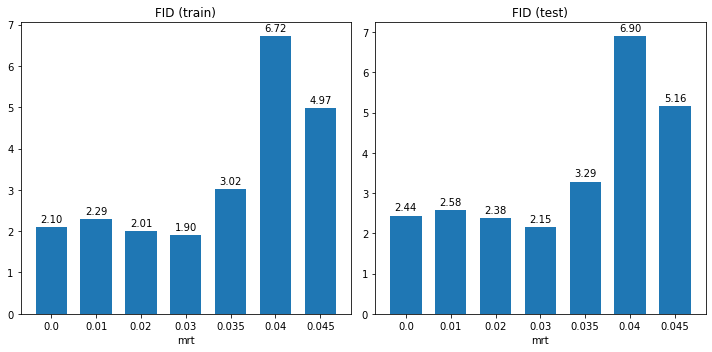

In [17]:
fids, gen_feats = calculate_inception_metrics(samplers, return_feats=True)

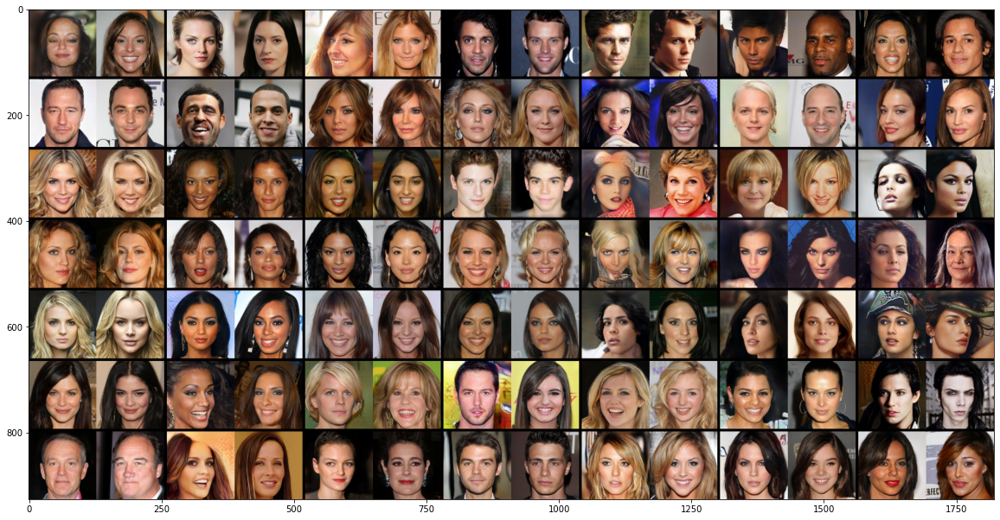

In [18]:
# use_penultimate=True (only pool no flip)
nnds, nnd_indices = misc.visualize_1nns(samplers[0.00][0], celebahq_128_dls['train'], proj_model,
                                        conditional=False, return_indices=True)

In [16]:
_, gen_feat, _ = misc.project(samplers[0.00][0], proj_model, n_samples=feats['train'].shape[0], 
                              to_numpy=True, return_logits=None)

In [17]:
nnds, nn_indices = misc.calculate_knnd_numpy(target_feats=gen_feat, ref_feats=feats['train'])

[1. 1. 1. 1. 2. 2. 3. 4. 6.]
converage=0.381
16711


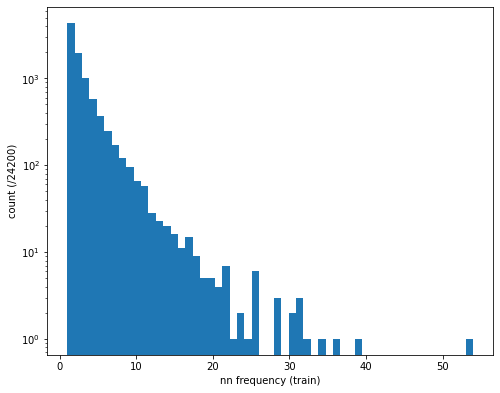

In [47]:
nn_unique, nn_counts = np.unique(nn_indices, return_counts=True)
plt.figure(figsize=(8, 6.4))
plt.hist(nn_counts, bins=max(nn_counts) + 1)
plt.yscale('log')
plt.xlabel('nn frequency (train)')
plt.ylabel(f'count (/{nn_indices.shape[0]})')
print(np.quantile(nn_counts, np.arange(0.1, 1, 0.1)))
print(f"converage={len(nn_counts) / feats['train'].shape[0]:.3f}")
print(nn_unique[np.argmax(nn_counts)])

(-0.5, 127.5, 127.5, -0.5)

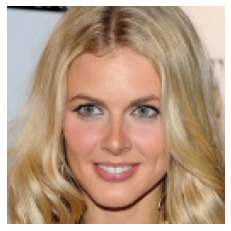

In [49]:
plt.imshow((celebahq_128_train_dset[16711][0].detach().cpu().numpy().transpose(1, 2, 0) + 1.) / 2.)
plt.axis('off')

In [18]:
rev_nnds, rev_nn_indices = misc.calculate_knnd_numpy(target_feats=feats['train'], ref_feats=gen_feat)

In [19]:
rev_nnds.shape, nnds.shape

((24183,), (24200,))

0.023101127147674563
0.02679702043533325
0.029856020212173463
0.03300014734268188
0.03624984622001648
0.039968347549438475
0.04450053572654725
0.05057828426361084
0.06099063158035278


Text(0, 0.5, 'count')

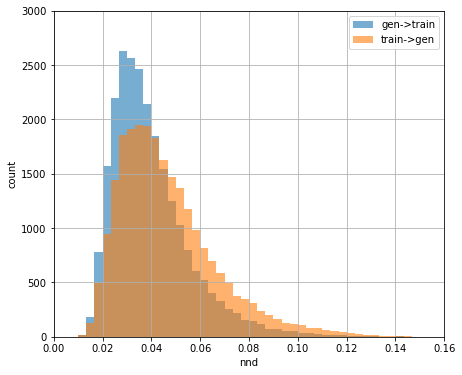

In [21]:
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

bins = np.arange(0, 0.15, 0.15 / 45)

plt.figure(figsize=(7, 6))
plt.hist(nnds, bins=bins, alpha=0.6, label='gen->train')
plt.hist(rev_nnds, bins=bins, alpha=0.6, label='train->gen')
for q in np.quantile(nnds, np.arange(0.1, 1, 0.1)):
    # plt.axvline(q, color='tab:blue')
    print(q)
plt.xlim(0, 0.16)
plt.ylim(0, 3000)
plt.grid()
plt.legend()
plt.xlabel('nnd')
plt.ylabel('count')

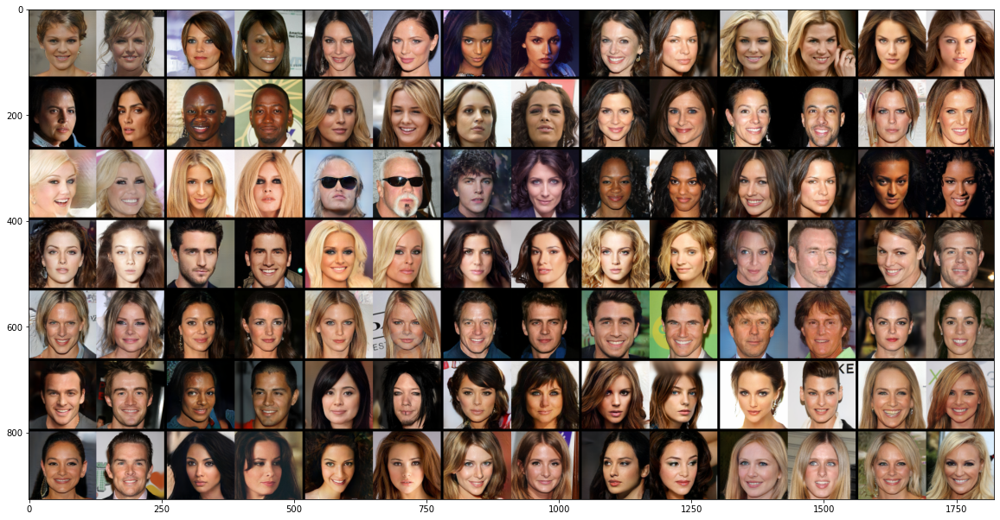

In [18]:
# use_penultimate=True (only pool)
nnds = misc.visualize_1nns(samplers[0.00][0], celebahq_128_dls['train'], proj_model,
                           conditional=False)

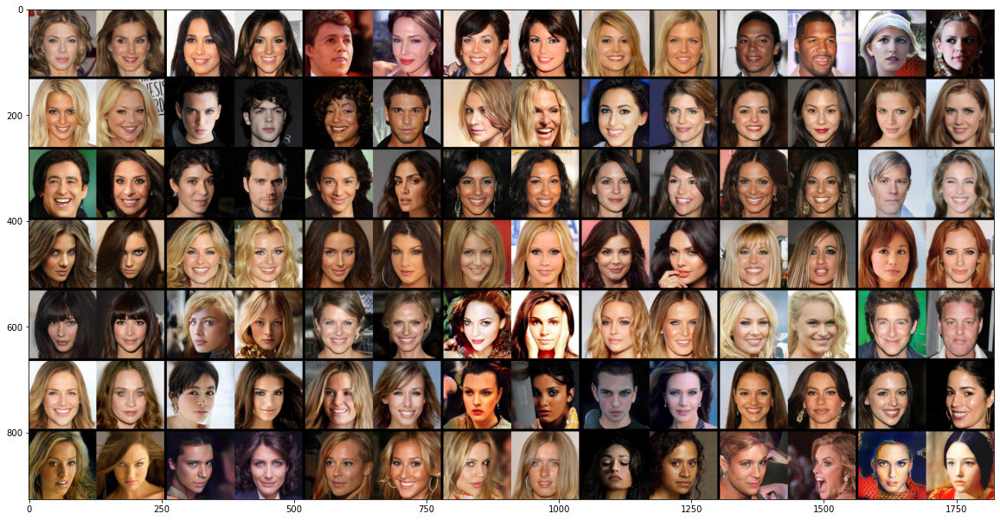

In [50]:
# use_penultimate=True
nnds = misc.visualize_1nns(samplers[0.00][0], celebahq_128_dls['train'], proj_model,
                           conditional=False)

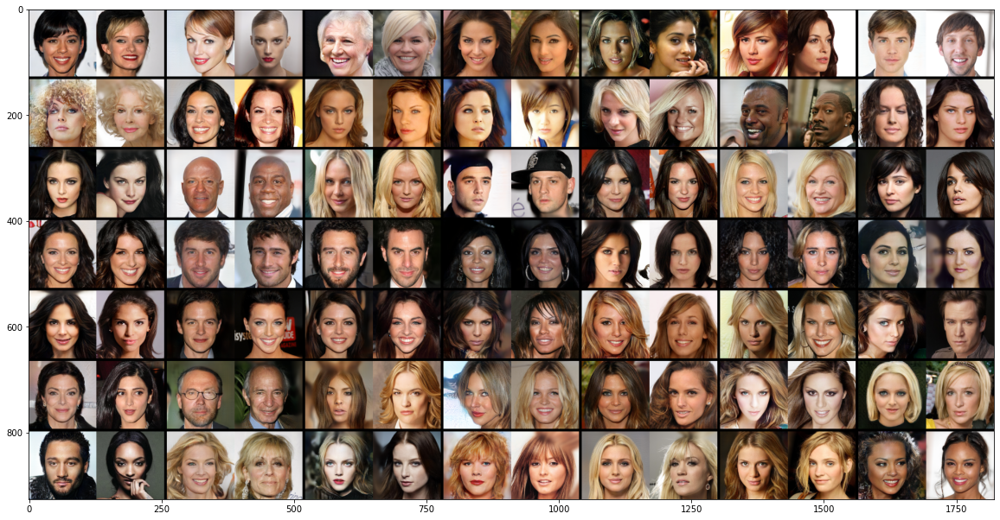

In [52]:
# use_penultimate=False
nnds = misc.visualize_1nns(samplers[0.00][0], celebahq_128_dls['train'], proj_model,
                           conditional=False)

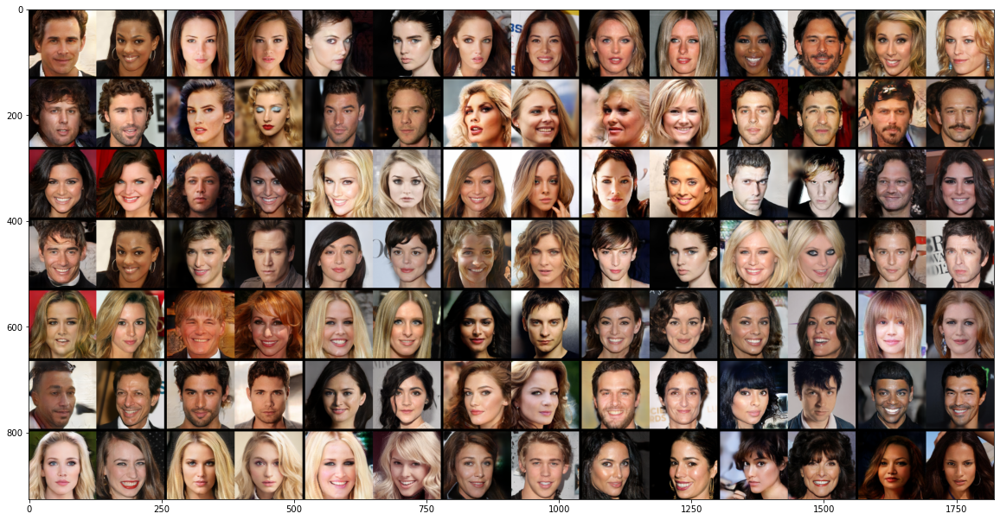

In [53]:
nnds = misc.visualize_1nns(samplers[0.01][0], celebahq_128_dls['train'], proj_model,
                           conditional=False)

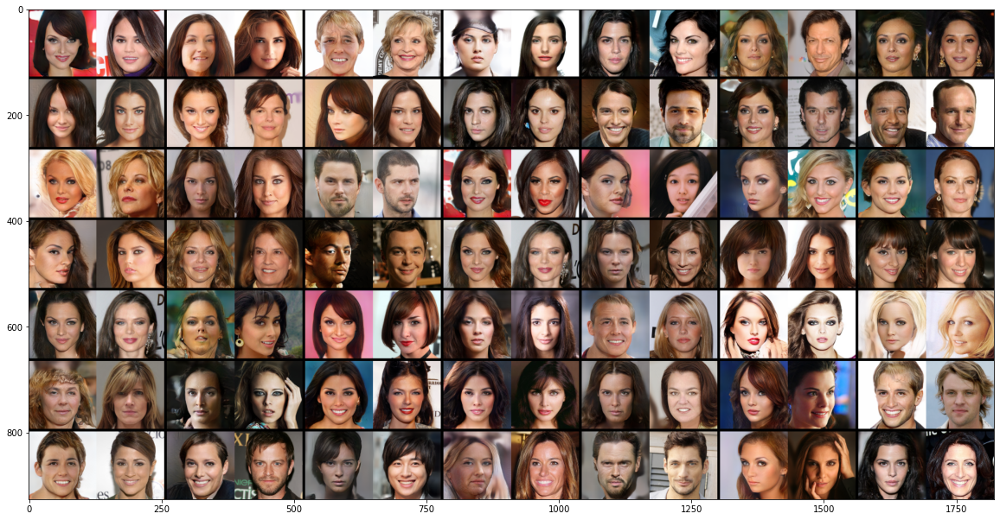

In [54]:
nnds = misc.visualize_1nns(samplers[0.04][0], celebahq_128_dls['train'], proj_model,
                           conditional=False)

In [19]:
train_pool = feats['train']
pca_xf = PCA(n_components=64).fit(train_pool)
train_pca = pca_xf.transform(train_pool)

In [20]:
n_clusters = min(feats['test'].shape[0], train_pool.shape[0]) // 100
print(n_clusters)

58


In [21]:
km_clf = KMeans(n_clusters=n_clusters).fit(train_pca)
T_labels = km_clf.predict(train_pca)

In [22]:
test_pool = feats['test']
test_pca = pca_xf.transform(test_pool)
Pn_labels = km_clf.predict(test_pca)

In [23]:
C_Ts = {}
for mrt, sampled_activations in gen_feats.items():
    for sampled_activation in sampled_activations:
        gen_pool = sampled_activation
        gen_pca = pca_xf.transform(gen_pool)
        Qm_labels = km_clf.predict(gen_pca)
        # Qm_labels = km_clf.predict(sampled_pool)

        # C_T = data_copying_tests.C_T(test_pca, Pn_labels, gen_pca, Qm_labels, 
        #                              train_pca, T_labels, tau=20 / len(gen_pca))
        C_T = data_copying_tests.C_T(test_pool, Pn_labels, gen_pool, Qm_labels, 
                                     train_pool, T_labels, tau=20 / len(gen_pool))
        if mrt not in C_Ts:
            C_Ts[mrt] = [C_T]
        else:
            C_Ts[mrt].append(C_T)
stats_ = {mrt: {'C_T_mean': np.mean(C_Ts_), 'C_T_std': np.std(C_Ts_)}
          for mrt, C_Ts_ in C_Ts.items()}
print(C_Ts)

{0.0: [-3.262425949448487], 0.01: [-3.0569421975091178], 0.02: [-2.077642136004151], 0.03: [-2.2575509028110075], 0.035: [-3.175909992205166], 0.04: [-1.675387668090775], 0.045: [-1.8885885078519808]}


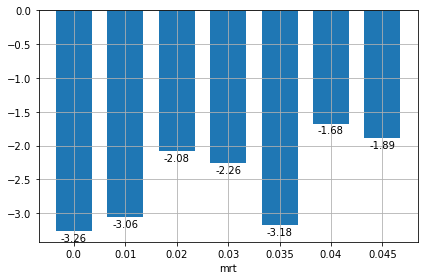

In [24]:
x = np.arange(len(C_Ts))  # the label locations
width = 0.7

rects = plt.bar(x, [v['C_T_mean'] for mrt, v in stats_.items()], width,
               yerr=[v['C_T_std'] for mrt, v in stats_.items()])

misc.autolabel(rects, plt)
plt.xticks(x, labels=list(stats_.keys()))
# plt.set_title(f"C_T (class = {cifar10_classnames[n_class]})")

plt.xlabel('mrt')
# plt.ylim(-4, 1)
# plt.legend(loc='lower right')
plt.grid()

plt.tight_layout()
# plt.savefig('data_copying_metrics(mrts).pdf', bbox_inches='tight')